In [1]:
from __init__ import * 

In [2]:
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
## for Palatino and other serif fonts use:
#rc('font',**{'family':'serif','serif':['Palatino']})
rc('text', usetex=True)

# GT 


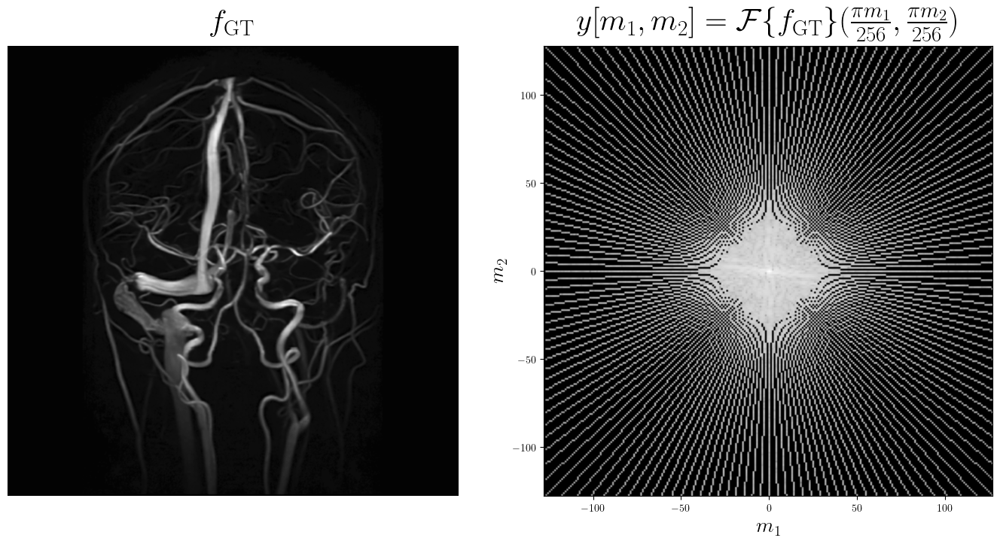

In [26]:
device = 'cuda:2'
grid_eval = torch.load('ExpA/data/grid_eval.pt').to(device)
gt = torch.load('ExpA/data/gt_CS.pt').to(device)
y = torch.load('ExpA/data/y_CS.pt').to(device)

a = int(1500); b = int(2000); c = int(500); d = int(500); 
a = int(1660/1); b = int(1500/1); c = int(700/1); d = int(700/1); 

plt.figure(figsize=(14, 7))
plt.subplot(121)
plt.imshow((gt)[0, 0].cpu(), cmap='gray'); plt.axis('off')
plt.title('$f_{\mathrm{GT}}$', y = 1.02, fontsize=30)
plt.subplot(122)
plt.imshow(torch.log(torch.abs(torch.fft.fftshift(y[0, 0, :, :])) +1e-9).cpu().numpy(), cmap='gray', extent=[-128, 127, -128, 128])
plt.title('$y$', fontsize=15)
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
plt.title(r'$y[m_1, m_2] = \mathcal{F}\{f_{\mathrm{GT}}\}(\frac{\pi m_1}{256}, \frac{\pi m_2}{256})$',y = 1.02, fontsize=30)
plt.xlabel('$m_1$', fontsize=20)
plt.ylabel('$m_2$', fontsize=20)
plt.savefig('ExpA/saved_figs/ground_truth.pdf', bbox_inches='tight')
plt.show()


In [4]:
def return_sol_on_fine(sol, exp_name):
    if exp_name.find('cpwl') > 0:
        sol_grid = BoxGrid(sol.size(2), 0, 512, c_init=sol, device=device)
    else:
        sol_grid = PixelGrid(sol.size(2)+1, 0, 512, c_init=sol, device=device)
        
    eval_fine = sol_grid.evaluate(grid_eval).view(1, 1, 4096, 4096)
    return eval_fine

$\epsilon_2=1e-6$, $N_{\mathrm{iter}_1} = 2000$, $N_{\mathrm{iter}_2} = 500$

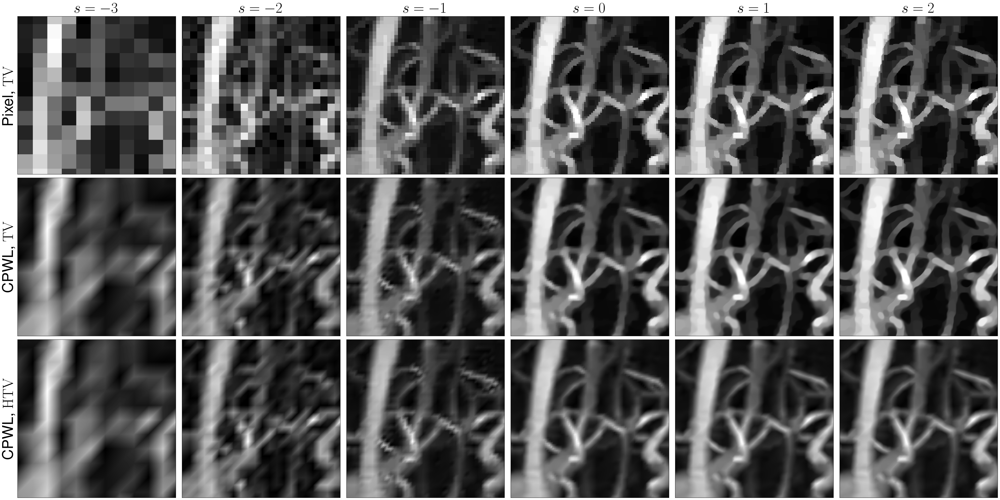

In [5]:
lmbda = 1e-6
toi = 1e-6
N_iter_in = 500
N_iter_out = 2000
N = 6
cond = 'pos' # 'none'
exps = ['ExpA_CS_pixel_tv','ExpA_CS_cpwl_tv_l2', 'ExpA_CS_cpwl_htv']

l = 7
# plt.figure(figsize=(l * N, l * len(exps)))
plt.figure(figsize=(l * N, l * len(exps)))
s = 0
for exp_id, exp_name_raw in enumerate(exps):

    exp_name = exp_name_raw + '_' + str(lmbda) + '_' + str(toi) + '_' +  str(N) + '_' + str(N_iter_in) + '_' + str(N_iter_out) + '_' + cond
    
    if exp_name_raw == 'GT':
        s = 1
        for scale in range(6):
            #id = (exp_id+1) + (scale) * len(exps); 
            id = id = (exp_id) * N + (scale + 1)
            #plt.subplot(N, len(exps), id); plt.axis('off')
            plt.subplot(len(exps), N, id); 
            plt.imshow(gt[0, 0, b:b+d, a:a+c].cpu(), cmap='gray')
            plt.tick_params(bottom=False,  top=False, labelbottom=False) 
            plt.gca().set_yticks([])
            plt.ylabel('Ground Truth', fontsize=45)
    else:
        costs = torch.load('ExpA/saved_results/mrs_cost' + exp_name +'.pt.pt')
        for scale in range(N):
            sol = torch.load('ExpA/saved_results/mrs' + str(scale)+ '_' +exp_name +'.pt')
            eval_fine = return_sol_on_fine(sol, exp_name)
            psnr = np.round(compute_PSNR(eval_fine[:, :, b:b+d, a:a+c], gt[:, :, b:b+d, a:a+c], 1), 2)

            #id = (exp_id+1) + (scale) * len(exps); 
            id = (exp_id) * N + (scale + 1)
            #plt.subplot(N, len(exps), id); 
            plt.subplot(len(exps), N, id); 
            plt.tick_params(bottom=False,  top=False, labelbottom=False) 
            plt.gca().set_yticks([])
            plt.imshow(eval_fine[0, 0, b:b+d, a:a+c].cpu(), cmap='gray')
            if scale == 0:
                if exp_id == s:
                    plt.ylabel('Pixel, $\mathrm{TV}$', fontsize=45)
                '''if exp_id == s+1:
                    plt.ylabel('CPWL, $\mathrm{TV}_1$', fontsize=45)'''
                if exp_id == s+1:
                    plt.ylabel('CPWL, $\mathrm{TV}$', fontsize=45)
                if exp_id == s+2:
                    plt.ylabel('CPWL, $\mathrm{HTV}$', fontsize=45)

            if exp_id == 0:
                plt.title('$s={' + str(scale-3) + '}$', fontsize=45)
            #plt.title('T=' + str(2**(-scale+3)) + ', PSNR=' + str(psnr) + ', $J(f_{' + str(scale-3) + '})$=' + str(np.round(costs[scale], 4)), fontsize=27)

plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
plt.savefig('ExpA/saved_figs/multires.pdf', bbox_inches='tight')
plt.show()    


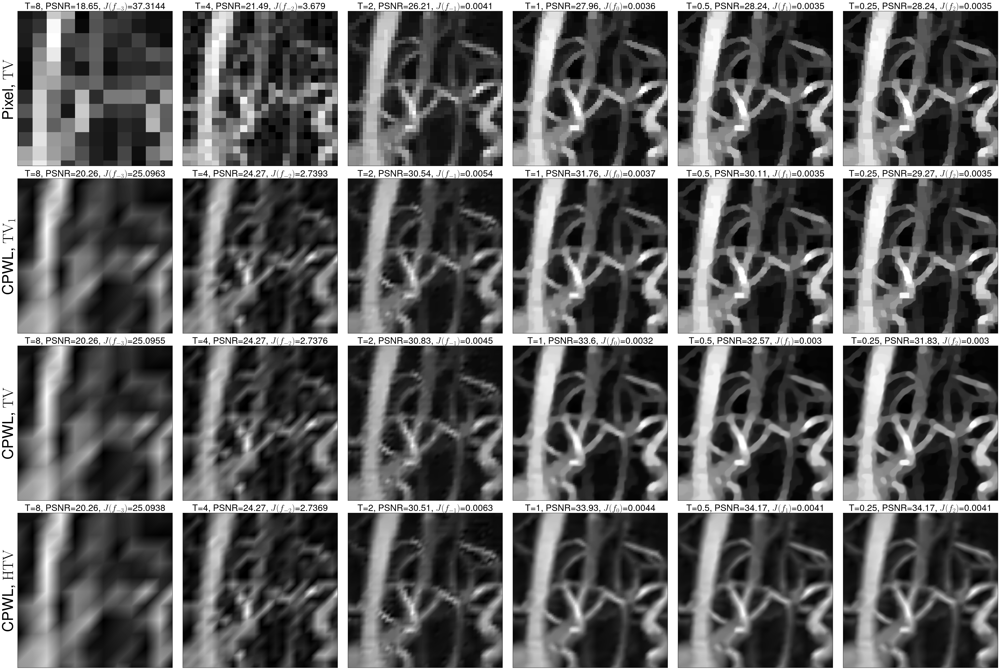

In [6]:
lmbda = 1e-6
toi = 1e-6
N_iter_in = 500
N_iter_out = 2000
N = 6
cond = 'pos' # 'none'
exps = ['ExpA_CS_pixel_tv', 'ExpA_CS_cpwl_tv_l1', 'ExpA_CS_cpwl_tv_l2', 'ExpA_CS_cpwl_htv']

l = 7
# plt.figure(figsize=(l * N, l * len(exps)))
plt.figure(figsize=(l * N, l * len(exps)))
s = 0
for exp_id, exp_name_raw in enumerate(exps):

    exp_name = exp_name_raw + '_' + str(lmbda) + '_' + str(toi) + '_' +  str(N) + '_' + str(N_iter_in) + '_' + str(N_iter_out) + '_' + cond
    
    if exp_name_raw == 'GT':
        s = 1
        for scale in range(6):
            #id = (exp_id+1) + (scale) * len(exps); 
            id = id = (exp_id) * N + (scale + 1)
            #plt.subplot(N, len(exps), id); plt.axis('off')
            plt.subplot(len(exps), N, id); 
            plt.imshow(gt[0, 0, b:b+d, a:a+c].cpu(), cmap='gray')
            plt.tick_params(bottom=False,  top=False, labelbottom=False) 
            plt.gca().set_yticks([])
            plt.ylabel('Ground Truth', fontsize=45)
    else:
        costs = torch.load('ExpA/saved_results/mrs_cost' + exp_name +'.pt.pt')
        for scale in range(N):
            sol = torch.load('ExpA/saved_results/mrs' + str(scale)+ '_' +exp_name +'.pt')
            eval_fine = return_sol_on_fine(sol, exp_name)
            psnr = np.round(compute_PSNR(eval_fine[:, :, b:b+d, a:a+c], gt[:, :, b:b+d, a:a+c], 1), 2)

            #id = (exp_id+1) + (scale) * len(exps); 
            id = (exp_id) * N + (scale + 1)
            #plt.subplot(N, len(exps), id); 
            plt.subplot(len(exps), N, id); 
            plt.tick_params(bottom=False,  top=False, labelbottom=False) 
            plt.gca().set_yticks([])
            plt.imshow(eval_fine[0, 0, b:b+d, a:a+c].cpu(), cmap='gray')
            if scale == 0:
                if exp_id == s:
                    plt.ylabel('Pixel, $\mathrm{TV}$', fontsize=45)
                if exp_id == s+1:
                    plt.ylabel('CPWL, $\mathrm{TV}_1$', fontsize=45)
                if exp_id == s+2:
                    plt.ylabel('CPWL, $\mathrm{TV}$', fontsize=45)
                if exp_id == s+3:
                    plt.ylabel('CPWL, $\mathrm{HTV}$', fontsize=45)

            plt.title('T=' + str(2**(-scale+3)) + ', PSNR=' + str(psnr) + ', $J(f_{' + str(scale-3) + '})$=' + str(np.round(costs[scale], 4)), fontsize=27)

plt.subplots_adjust(wspace=0, hspace=0.0)
plt.tight_layout()
plt.savefig('ExpA/saved_figs/multires_detailed.pdf', bbox_inches='tight')
plt.show()    


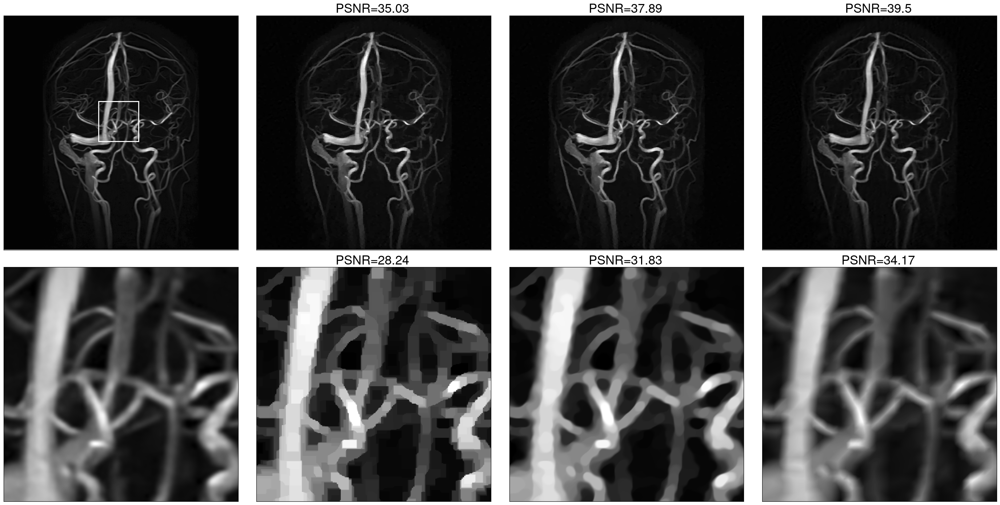

In [7]:
lmbda = 1e-6
toi = 1e-6
N_iter_in = 500
N_iter_out = 2000
N = 6
cond = 'pos' # 'none'
exps = ['GT', 'ExpA_CS_pixel_tv', 'ExpA_CS_cpwl_tv_l2', 'ExpA_CS_cpwl_htv']

l = 7
# plt.figure(figsize=(l * N, l * len(exps)))
plt.figure(figsize=(l * len(exps), l * 2))
s = 0
for exp_id, exp_name_raw in enumerate(exps):

    exp_name = exp_name_raw + '_' + str(lmbda) + '_' + str(toi) + '_' +  str(N) + '_' + str(N_iter_in) + '_' + str(N_iter_out) + '_' + cond
    
    if exp_name_raw == 'GT':
        s = 1
        plt.subplot(2, len(exps), 1)
        plt.imshow(gt[0, 0].cpu(), cmap='gray')
        plt.tick_params(bottom=False,  top=False, labelbottom=False) 
        rect = patches.Rectangle((a, b), c, d, linewidth=2, edgecolor='w', facecolor='none')
        ax = plt.gca()
        ax.add_patch(rect)
        plt.gca().set_yticks([])
        #plt.ylabel('Ground Truth', fontsize=45)
        plt.subplot(2, 4, 5)
        plt.imshow(gt[0, 0, b:b+d, a:a+c].cpu(), cmap='gray')
        plt.tick_params(bottom=False,  top=False, labelbottom=False) 
        plt.gca().set_yticks([])
        #plt.ylabel('Ground Truth', fontsize=45)
    else:
        sol = torch.load('ExpA/saved_results/mrs' + str(5)+ '_' +exp_name +'.pt')
        eval_fine = return_sol_on_fine(sol, exp_name)
        psnr = np.round(compute_PSNR(eval_fine, gt, 1), 2)

        plt.subplot(2, len(exps), exp_id+1); 
        plt.tick_params(bottom=False,  top=False, labelbottom=False) 
        plt.gca().set_yticks([])
        plt.imshow(eval_fine[0, 0].cpu(), cmap='gray')
        plt.title('PSNR=' + str(psnr) , fontsize=25)
        
        psnr = np.round(compute_PSNR(eval_fine[:, :, b:b+d, a:a+c], gt[:, :, b:b+d, a:a+c], 1), 2)
        plt.subplot(2, len(exps), exp_id+5); 
        plt.tick_params(bottom=False,  top=False, labelbottom=False) 
        plt.gca().set_yticks([])
        plt.imshow(eval_fine[0, 0, b:b+d, a:a+c].cpu(), cmap='gray')
        '''if scale == 0:
            if exp_id == s:
                plt.ylabel('Pixel, $\mathrm{TV}$', fontsize=45)
            if exp_id == s+1:
                plt.ylabel('CPWL, $\mathrm{TV}_1$', fontsize=45)
            if exp_id == s+2:
                plt.ylabel('CPWL, $\mathrm{TV}$', fontsize=45)
            if exp_id == s+3:
                plt.ylabel('CPWL, $\mathrm{HTV}$', fontsize=45)'''

        plt.title('PSNR=' + str(psnr) , fontsize=25)

plt.subplots_adjust(wspace=0, hspace=0.0)
plt.tight_layout()
#plt.savefig('ExpA/saved_figs/multires_detailed.pdf', bbox_inches='tight')
plt.show()    


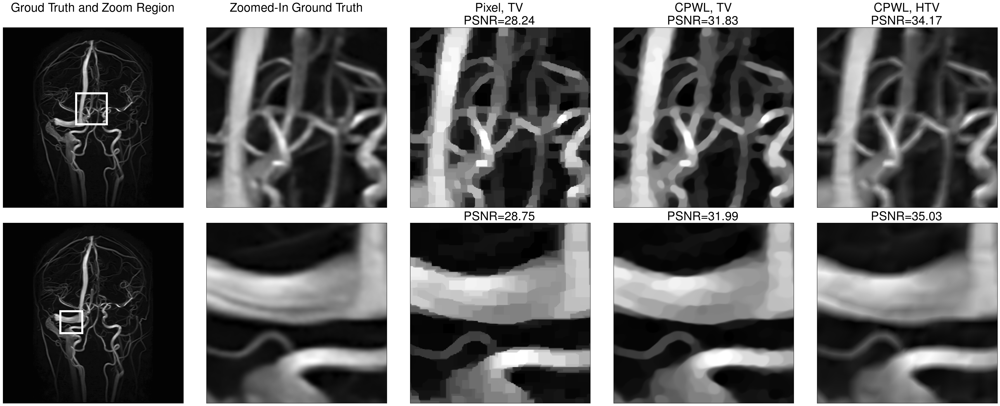

In [17]:
lmbda = 1e-6
toi = 1e-6
N_iter_in = 500
N_iter_out = 2000
N = 6
cond = 'pos' # 'none'
exps = ['GT', 'ExpA_CS_pixel_tv', 'ExpA_CS_cpwl_tv_l2', 'ExpA_CS_cpwl_htv']

l = 7
# plt.figure(figsize=(l * N, l * len(exps)))
n_modes = 2
plt.figure(figsize=(l * 5, l * n_modes))
s = 0
for exp_id, exp_name_raw in enumerate(exps):

    exp_name = exp_name_raw + '_' + str(lmbda) + '_' + str(toi) + '_' +  str(N) + '_' + str(N_iter_in) + '_' + str(N_iter_out) + '_' + cond
    
    for mode in range(n_modes):
        if mode == 0:
            a = 0; b = 0; c = gt.size(2); d = gt.size(3); 
        if mode == 0:
            a = int(1660/1); b = int(1500/1); c = int(700/1); d = int(700/1); 
        if mode == 1:
            a = int(1300); b = int(2000); c = int(500); d = int(500); 
            
        if exp_name_raw == 'GT':
            s = 1
            plt.subplot(n_modes, 5, 1 + mode * 5)
            if mode == 0:
                plt.title('Groud Truth and Zoom Region \n', fontsize=30)
            plt.imshow(gt[0, 0].cpu(), cmap='gray')
            plt.tick_params(bottom=False,  top=False, labelbottom=False) 
            rect = patches.Rectangle((a, b), c, d, linewidth=5, edgecolor='w', facecolor='none')
            ax = plt.gca()
            ax.add_patch(rect)
            plt.gca().set_yticks([])
            #plt.ylabel('Ground Truth', fontsize=45)
            plt.subplot(n_modes, 5, 2 + mode * 5)
            if mode == 0:
                plt.title('Zoomed-In Ground Truth \n', fontsize=30)
            
            plt.imshow(gt[0, 0, b:b+d, a:a+c].cpu(), cmap='gray')
            plt.tick_params(bottom=False,  top=False, labelbottom=False) 
            plt.gca().set_yticks([])
            #plt.ylabel('Ground Truth', fontsize=45)
        else:
            sol = torch.load('ExpA/saved_results/mrs' + str(5)+ '_' +exp_name +'.pt')
            eval_fine = return_sol_on_fine(sol, exp_name)
            
            psnr = np.round(compute_PSNR(eval_fine[:, :, b:b+d, a:a+c], gt[:, :, b:b+d, a:a+c], 1), 2)
            plt.subplot(n_modes, 5, exp_id+2  + mode * 5); 
            plt.tick_params(bottom=False,  top=False, labelbottom=False) 
            plt.gca().set_yticks([])
            plt.imshow(eval_fine[0, 0, b:b+d, a:a+c].cpu(), cmap='gray')

            if mode == 0:
                if exp_id == 1:
                    str_t = 'Pixel, TV\nPSNR=' + str(psnr) 
                if exp_id == 2:
                    str_t = 'CPWL, TV\nPSNR=' + str(psnr) 
                if exp_id == 3:
                    str_t = 'CPWL, HTV\nPSNR=' + str(psnr) 
            
            else: 
                str_t = 'PSNR=' + str(psnr) 
            plt.title(str_t, fontsize=30)

plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
plt.savefig('ExpA/saved_figs/compare.pdf', bbox_inches='tight')
plt.show()    

In [8]:
lmbda = 1e-6
toi = 1e-6
N_iter_in = 500
N_iter_out = 2000
N = 6
cond = 'pos' # 'none'
exps = ['ExpA_CS_pixel_tv', 'ExpA_CS_cpwl_tv_l2', 'ExpA_CS_cpwl_htv']

for exp_id, exp_name_raw in enumerate(exps):
    if exp_name_raw == 'GT':
        pass
    else:
        print('---------------' + exp_name_raw + '---------------')
        for i, name_add in enumerate(['', '_very_fine']):
            if i == 0:
                N_iter_out = 2000; N = 6
            else:
                N_iter_out = 10000; N = 1
            exp_name = exp_name_raw + name_add +'_' + str(lmbda) + '_' + str(toi) + '_' +  str(N) + '_' + str(N_iter_in) + '_' + str(N_iter_out) + '_' + cond
            costs = torch.load('ExpA/saved_results/mrs_cost' + exp_name +'.pt.pt')
            iters = torch.load('ExpA/saved_results/mrs_iters' + exp_name +'.pt')
            times = torch.load('ExpA/saved_results/mrs_times' + exp_name +'.pt')
            times = [np.round(t, 2) for t in times]

            time_toal = np.round(torch.load('ExpA/saved_results/mrs_time_total' + exp_name +'.pt'), 0)

            if i == 0:
                print('---- Multiresolution:')
            else:
                print('---- Direct Solving on T=0.25:')

            #print('costs:', costs)
            print('iters:', iters)
            print('times GPU:', times)
            print('total time GPU:', time_toal, 'seconds')

---------------ExpA_CS_pixel_tv---------------
---- Multiresolution:
iters: [27, 145, 1418, 1738, 1826, 1491]
times GPU: [0.99, 2.01, 25.23, 159.67, 1956.11, 4846.55]
total time GPU: 6991.0 seconds
---- Direct Solving on T=0.25:
iters: [1831]
times GPU: [5633.99]
total time GPU: 5634.0 seconds
---------------ExpA_CS_cpwl_tv_l2---------------
---- Multiresolution:
iters: [38, 161, 1536, 1148, 862, 670]
times GPU: [0.86, 0.79, 10.61, 46.49, 261.68, 2169.57]
total time GPU: 2490.0 seconds
---- Direct Solving on T=0.25:
iters: [1454]
times GPU: [6460.39]
total time GPU: 6460.0 seconds
---------------ExpA_CS_cpwl_htv---------------
---- Multiresolution:
iters: [38, 161, 1330, 755, 481, 293]
times GPU: [0.84, 0.71, 15.42, 60.07, 320.67, 874.37]
total time GPU: 1272.0 seconds
---- Direct Solving on T=0.25:
iters: [992]
times GPU: [3075.6]
total time GPU: 3076.0 seconds


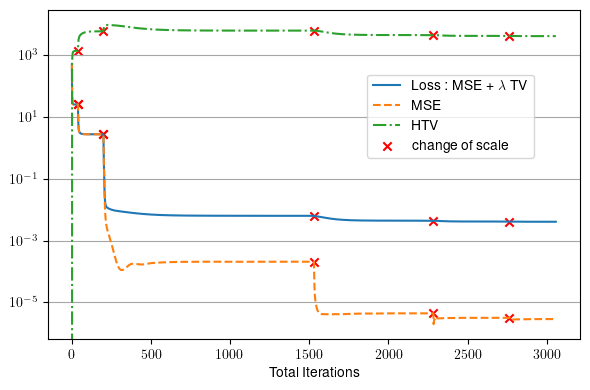

In [10]:
lmbda = 1e-6
toi = 1e-6
N_iter_in = 500
N_iter_out = 2000
N = 6
cond = 'pos' # 'none'
exps = ['ExpA_CS_cpwl_htv'] 

for exp_id, exp_name_raw in enumerate(exps):
    if exp_name_raw == 'GT':
        pass
    else:
        exp_name = exp_name_raw +'_' + str(lmbda) + '_' + str(toi) + '_' +  str(N) + '_' + str(N_iter_in) + '_' + str(N_iter_out) + '_' + cond

        losses = torch.load('ExpA/saved_results/mrs_loss' + exp_name +'.pt')
        regs = torch.load('ExpA/saved_results/mrs_reg' + exp_name +'.pt')
        mses = torch.load('ExpA/saved_results/mrs_mse' + exp_name +'.pt')
        iters = torch.load('ExpA/saved_results/mrs_iters' + exp_name +'.pt')

        flat_loss = np.array([item for sublist in losses for item in sublist])
        flat_mse = np.array([item for sublist in mses for item in sublist])
        flat_reg = np.array([item for sublist in regs  for item in sublist])

        scale_change = np.array( list(it.accumulate(iters[:-1]))).astype('int') - 1

        plt.figure(figsize=(6, 4))
        plt.plot(flat_loss, label='Loss : MSE + $\lambda$ TV')
        plt.plot(flat_mse, label='MSE', linestyle='dashed')
        plt.plot(flat_reg, label='HTV', linestyle='-.')
        plt.yscale('log')
        plt.grid(True, axis = 'y', which="both", ls="-", color='0.65')
        plt.scatter(scale_change, flat_loss[scale_change], c='red', marker='x', label='change of scale')
        plt.scatter(scale_change, flat_mse[scale_change], c='red', marker='x')
        plt.scatter(scale_change, flat_reg[scale_change], c='red', marker='x')
        plt.legend(loc=(0.6, 0.55)); 
        plt.xlabel('Total Iterations')
        plt.tight_layout()
        plt.show()

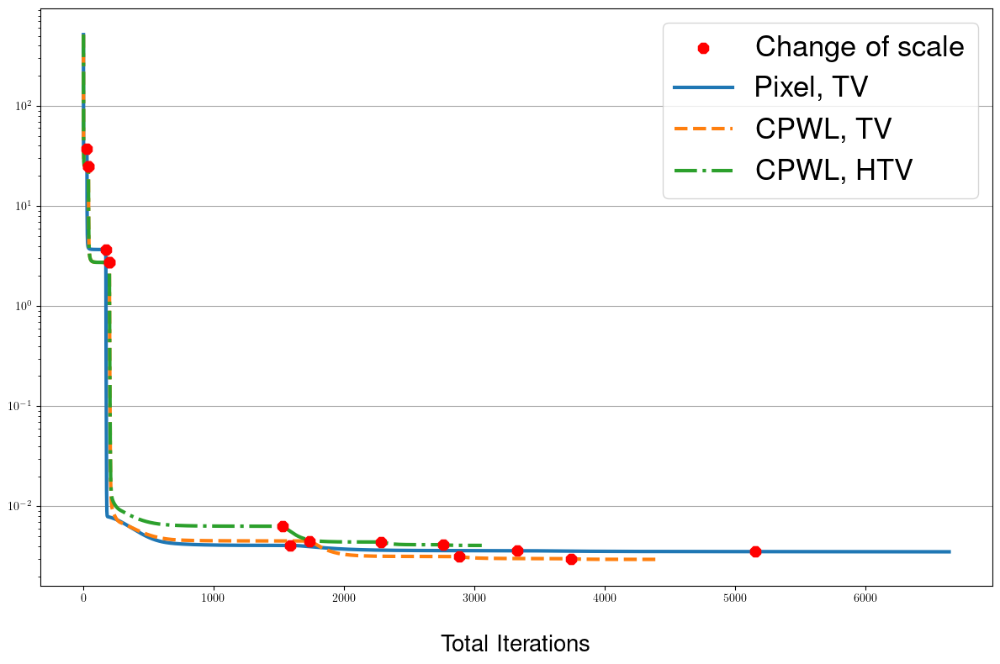

In [12]:
lmbda = 1e-6
toi = 1e-6
N_iter_in = 500
N_iter_out = 2000
N = 6
cond = 'pos' # 'none'
exps = ['ExpA_CS_pixel_tv','ExpA_CS_cpwl_tv_l2', 'ExpA_CS_cpwl_htv']

plt.figure(figsize=(12, 8))

for exp_id, exp_name_raw in enumerate(exps):
    if exp_name_raw == 'GT':
        pass
    else:
        exp_name = exp_name_raw +'_' + str(lmbda) + '_' + str(toi) + '_' +  str(N) + '_' + str(N_iter_in) + '_' + str(N_iter_out) + '_' + cond

        losses = torch.load('ExpA/saved_results/mrs_loss' + exp_name +'.pt')
        regs = torch.load('ExpA/saved_results/mrs_reg' + exp_name +'.pt')
        mses = torch.load('ExpA/saved_results/mrs_mse' + exp_name +'.pt')
        iters = torch.load('ExpA/saved_results/mrs_iters' + exp_name +'.pt')

        flat_loss = np.array([item for sublist in losses for item in sublist])
        flat_mse = np.array([item for sublist in mses for item in sublist])
        flat_reg = np.array([item for sublist in regs  for item in sublist])

        scale_change = np.array( list(it.accumulate(iters[:-1]))).astype('int') - 1

        plt.yscale('log')
        plt.grid(True, axis = 'y', which="major", ls="-", color='0.65')
        if exp_id == 0:
            plt.scatter(scale_change, flat_loss[scale_change], c='red', marker='8', label='Change of scale', s=90, zorder=5)
        else:
            plt.scatter(scale_change, flat_loss[scale_change], c='red', marker='8', s=90,  zorder=5)

        if exp_id == 0:
            plt.plot(flat_loss, '-', label='Pixel, TV', linewidth=3)
        elif exp_id == 1:
            plt.plot(flat_loss, '--',label='CPWL, TV', linewidth=3)
        elif exp_id == 2:
            plt.plot(flat_loss, '-.',label='CPWL, HTV', linewidth=3)
        

        

plt.legend(fontsize=25)
plt.xlabel('\n Total Iterations', fontsize=20)
plt.tight_layout()
plt.savefig('ExpA/saved_figs/loss.pdf')
plt.show()